# AP - AUTOMAÇÃO DA PRODUÇÃO

---

Análise de dados realizada como avaliação da disciplina de Automação da Produção do Centro Universitário La Salle - RJ
[ PROFESSOR PEDRO BASÍLIO ]

# Análise sobre DataSet de Vendas Global de Jogos Eletrônicos entre 1980 e 2016.



##Alunos: 



*   Rodrigo Vianinni 
*   Victor Ramiro 
*   Yanko Richa
*   Luisa 
*   Daniel 



# CONHECENDO A BASE DE DADOS - DATASET



## IMPORTANDO AS BIBLIOTECAS:

---

Importação das bibliotecas clássicas e outras complementares, como por exemplo:

- O CSV, responsável pela leitura e escrita de arquivos no formato csv; 
- O PANDAS que auxilia na exploração, tratamento e manipulação dos dados; 
- As bibliotecas gráficas Matplotlib, Seaborn e Plotly.

- Utilizamos o comando mágico que executa a configuração necessária nos bastidores para que o IPython funcione corretamente de mãos dadas matplotlib;

- Realizando teste de interatividade, usando o nbagg back - end com %matplotlib notebook, levará a gráficos interativos incorporados ao notebook, você pode ampliar e redimensionar a figura

%matplotlib inline: desenhe apenas.

In [ ]:
import pandas as pd                                                               
import csv                                                                       
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.io as pio

%matplotlib inline
#%matplotlib notebook                                                                                                 

## IMPORTANDO O ARQUIVO

---

Importamos o arquivo direto do GitHub atavés do caminho:

- zhonglism -> vgsales.csv -> RAW -> copia o caminho

In [ ]:
df_games = pd.read_csv('https://gist.githubusercontent.com/zhonglism/f146a9423e2c975de8d03c26451f841e/raw/f79e190df4225caed58bf360d8e20a9fa872b4ac/vgsales.csv')
df_games.head(2)

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24


### Ajustando a nomenclatura das colunas do Dataset

---

- É criado um dicionário com o método RENAME, onde é renomeado as colunas, assim, seguindo "key" e 'Values", respectivamente. Atribuímos a variavel para a alteração ser finalizada, outra forma de obter o mesmo resultado é utilizando o método INPLACE=TRUE.

- O método RENAME_AXIS é utilizado na conclusão do dicionário, afim de, nomear o index como IDX.

In [ ]:
#Ajustando o nome das colunas 
df_games = df_games.rename(columns={"Name": "Jogo", 
                            "Platform": "Plataforma", 
                            "Year": "Ano", 
                            "Genre": "Categoria", 
                            "NA_Sales": "Vendas_NA", 
                            "EU_Sales": "Vendas_EU", 
                            "JP_Sales": "Vendas_JP", 
                            "Other_Sales":"Vendas_Outros", 
                            "Global_Sales": "Vendas_Total"
                            }).rename_axis('idx')
df_games.head

<bound method NDFrame.head of         Rank  ... Vendas_Total
idx           ...             
0          1  ...        82.74
1          2  ...        40.24
2          3  ...        35.82
3          4  ...        33.00
4          5  ...        31.37
...      ...  ...          ...
16593  16596  ...         0.01
16594  16597  ...         0.01
16595  16598  ...         0.01
16596  16599  ...         0.01
16597  16600  ...         0.01

[16598 rows x 11 columns]>

### .INFO( )

---

Verifica as informações iniciais do arquivo:

[ indice | dados | Contagem não nula | tipo de dados | memoria utilizada ] 

Após esta analise inicial teremos um "norte" para estruturar o raciocínio.

In [ ]:
# IMPRIMINDO AS INFORMAÇÕES DAS COLUNAS:

'''  
    memoria utilizada -> 1.4+ MB '''

df_games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Rank           16598 non-null  int64  
 1   Jogo           16598 non-null  object 
 2   Plataforma     16598 non-null  object 
 3   Ano            16327 non-null  float64
 4   Categoria      16598 non-null  object 
 5   Publisher      16540 non-null  object 
 6   Vendas_NA      16598 non-null  float64
 7   Vendas_EU      16598 non-null  float64
 8   Vendas_JP      16598 non-null  float64
 9   Vendas_Outros  16598 non-null  float64
 10  Vendas_Total   16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


### .DESCRIBE( )

---

Demonstra as principais funções estatíticas.

In [ ]:
df_games.describe()

,Rank,Ano,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
count,16598.000000,16327.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,2006.406443,0.264667,0.146652,0.077782,0.048063,0.537441
std,4791.853933,5.828981,0.816683,0.505351,0.309291,0.188588,1.555028
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4151.250000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8300.500000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12449.750000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.470000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


### .DESCRIBE(INCLUDE=[ 'OBJECT' ])

---

Determina o tipo de dado dtype a ser filtrado, neste caso, limita-se OBJETO, trazendo: 

- A quantidade de jogos, lembrando que ainda nao tratamos a base de dados, podendo haver dados NaN ou com valor igual a ZERO;

- A quantidade de dados únicos;

- O item mais frequente e suas características;

- A frequencia do item acima.

In [ ]:
df_games.describe(include=['object'])

,Jogo,Plataforma,Categoria,Publisher
count,16598,16598,16598,16540
unique,11493,31,12,578
top,Need for Speed: Most Wanted,DS,Action,Electronic Arts
freq,12,2163,3316,1351


### .DESCRIBE(MOSTRANDO OS PERCENTUAIS DE 10 EM 10)

---

- Em Vendas Totais percebemos onde os dados estarao distribuidos no momento de plotar o gráfico!

In [ ]:
df_games.describe(percentiles=[i/10 for i in range(1,10)])

,Rank,Ano,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
count,16598.000000,16327.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,2006.406443,0.264667,0.146652,0.077782,0.048063,0.537441
std,4791.853933,5.828981,0.816683,0.505351,0.309291,0.188588,1.555028
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
10%,1661.700000,1998.000000,0.000000,0.000000,0.000000,0.000000,0.020000
20%,3321.400000,2002.000000,0.000000,0.000000,0.000000,0.000000,0.050000
30%,4981.100000,2004.000000,0.010000,0.000000,0.000000,0.000000,0.080000
40%,6640.800000,2006.000000,0.040000,0.010000,0.000000,0.010000,0.120000
50%,8300.500000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
60%,9960.200000,2009.000000,0.120000,0.040000,0.000000,0.020000,0.250000


In [ ]:
df_describe = df_games.describe(percentiles=[i/100 for i in range(1,100)])
df_describe.tail(21)

,Rank,Ano,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
80%,13279.60,2011.0,0.31,0.16,0.06,0.05,0.6100
81%,13445.57,2011.0,0.33,0.17,0.07,0.05,0.6400
82%,13611.54,2011.0,0.35,0.18,0.07,0.06,0.6800
83%,13777.51,2011.0,0.37,0.19,0.08,0.06,0.7200
84%,13943.48,2012.0,0.40,0.21,0.09,0.06,0.7800
85%,14109.45,2012.0,0.42,0.22,0.10,0.07,0.8300
86%,14276.42,2012.0,0.45,0.24,0.11,0.07,0.8942
87%,14442.39,2012.0,0.48,0.26,0.12,0.08,0.9600
88%,14608.36,2013.0,0.52,0.29,0.14,0.09,1.0400
89%,14774.33,2013.0,0.56,0.32,0.15,0.10,1.1200


### .SHAPE

---

Imprime a quantidade de linhas e colunas [ retorna uma tupae com as dimensões da matriz ]

In [ ]:
df_games.shape

(16598, 11)

## FUNÇÃO LIMPA_DADOS( DF ) #

---

Verifica se há linhas com todos os valores nulos e as elimina. É utilizado p método DROPNA( HOW='ALL' ) para dropar(excluir) todas as linhas em que todos os valores sejam nulos.

In [ ]:
def limpa_dados(df):
  '''excluir todas as linhas que todos os valores são nulos'''
  return df.dropna(how='all')


In [ ]:
## Chamando a função
# Não houve alteração do numero de linhas, ou seja, não existem linhas com todos os valores nulos.
limpa_dados(df_games)

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...,...
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,Kemco,0.01,0.00,0.00,0.00,0.01
16594,16597,Men in Black II: Alien Escape,GC,2003.0,Shooter,Infogrames,0.01,0.00,0.00,0.00,0.01
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,Activision,0.00,0.00,0.00,0.00,0.01


## .ISNULL( ) - VISÃO ESPECÍFICA

---

Detecta valores de dados NaN em cada coluna, foi adicionado a função INPUT para filtrar coluna a coluna.

- se retirar a HASHTAG poderá selecionar via INPUT


In [ ]:
#df_games[df_games[input('Digite a coluna que deseja saber se existem valores com dados NaN: ')].isnull()].head()

## .ISNULL( ) - VISÃO GERAL

---

- ISNULL ( ) -> Faz uma verificação semelhante a anterior, porém, nos retorna como TRUE os intens NaN e FALSE os itens com valores válidos. Note que ao invés de obter um dado único, temos o retorno de uma Series com informações gerais;

- SUM( ) -> Imprime a quantidade de valores NaN de cada coluna, permitindo observar se é possível ou não desconsiderar alguma coluna da análise, por seus valores NaN distorcer os resultados destas análises ou até mesmo poderá ser considerado a possibilidade de preencher esses valores com a MEDIANA ou MÉDIA de cada coluna, dependendo da presença ou não de OUTLIERS.

In [ ]:
nulo = df_games.isnull()
nulo.sum()

Rank               0
Jogo               0
Plataforma         0
Ano              271
Categoria          0
Publisher         58
Vendas_NA          0
Vendas_EU          0
Vendas_JP          0
Vendas_Outros      0
Vendas_Total       0
dtype: int64

## .DROPNA ( )

--- 

Após a análise dos valores nulos por coluna, foi determinado a exclusão das colunas com valores destoantes, as quais, podem interferir diretamente na análise de dados.

In [ ]:
# Excluindo valores nulos nas colunas "Year" e "Publisher"
df_games.dropna(subset=['Ano'], axis=0, 
                inplace = True) # axis=0, indica a linha | inplace=True, indica que esta alteração será permanente.

df_games.dropna(subset=['Publisher'], 
                axis=0, 
                inplace = True)


In [ ]:
df_games.head(2)

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24


## .SHAPE( )

---

Após a exclusão de linhas, verifico a quantidade atualizada

In [ ]:
# Qtde de linhas antes de dropar = 16598 rows
df_games.shape 


(16291, 11)

In [ ]:
# Quantidade de linhas retiradas
qtde_antes_drop = 16598
qtde_apos_drop = 16291
qtde_linhas_retiradas = qtde_antes_drop - qtde_apos_drop
qtde_linhas_retiradas

307

## Tabela Dinâmica

--- 

Ferramenta exclusiva do GOOGLE COLAB que nos permite utilizar uma tabela dinâmica intuituva e eficiente, gerando uma pré-visualização das idéias referentes as hipóteses de análises.

In [ ]:
## Tabela Dinâmica
# Setas: Mudar a ordenação
# Filter: Alteração customizada '''

from google.colab.data_table import DataTable

In [ ]:
DataTable(df_games)


,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...,...
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,Kemco,0.01,0.00,0.00,0.00,0.01
16594,16597,Men in Black II: Alien Escape,GC,2003.0,Shooter,Infogrames,0.01,0.00,0.00,0.00,0.01
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,Activision,0.00,0.00,0.00,0.00,0.01


# ANALISES DE DADOS

# 01. QUAIS FORAM OS JOGOS MAIS POPULARES E QUE TIVERAM MAIOR NÚMERO DE VENDAS?


### .GROUPBY( )

- É um metodo de agrupamento de dados que aplica uma função para cada grupo separadamente, depois agrupa os resultados.


### .AGG( )

---

- É um método que agrega cada coluna (recurso) para cada grupo, então você acaba com um valor por coluna por grupo. É a forma ideal de passar uma lista de funções pelos grupos.

- O método AGG permite que as listas sejam passadas na forma de dicionários com funções diferentes para cada coluna, neste caso, usamos apenas a função SUM( ).

### .SORT_VALUES( )

---

- Ordena o dataframe a partir de uma coluna, utilizando o argumento ascending=False, os valores são impressos em ordem decrescente.

In [ ]:
# df_games_vendas.head(2)

In [ ]:
#Agrupando as Vendas por jogo ( Vendas Acumuladas)
df_games_vendas = df_games.groupby(["Jogo", "Categoria"]).agg({"Vendas_NA": "sum", 
                                                               "Vendas_EU": "sum", 
                                                               "Vendas_JP": "sum", 
                                                               "Vendas_Outros": "sum",  
                                                               "Vendas_Total": "sum"}
                                                              )

df_games_vendas = df_games_vendas.sort_values("Vendas_Total", 
                                              ascending= False)

df_games_vendas["Vendas_Total"] = df_games_vendas["Vendas_Total"].round(2)

df_games_vendas

,,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
Jogo,Categoria,,,,,
Wii Sports,Sports,41.49,29.02,3.77,8.46,82.74
Grand Theft Auto V,Action,23.46,23.04,1.39,8.03,55.92
Super Mario Bros.,Platform,32.48,4.88,6.96,0.99,45.31
Tetris,Puzzle,26.17,2.95,6.03,0.69,35.84
Mario Kart Wii,Racing,15.85,12.88,3.79,3.31,35.82
...,...,...,...,...,...,...
Tantei Jinguuji Saburo DS: Fuserareta Shinjitsu,Adventure,0.00,0.00,0.01,0.00,0.01
Eiyuu Densetsu: Sora no Kiseki Material Collection Portable,Role-Playing,0.00,0.00,0.01,0.00,0.01
Marginal #4: Idol of Supernova,Adventure,0.00,0.00,0.01,0.00,0.01


In [ ]:
# Separando Vendas Globais ( Vendas Acumuladas)
df_games_vendas_mundo = df_games.groupby(["Jogo"]).agg({"Vendas_Total": "sum"})

df_games_vendas_mundo = df_games_vendas_mundo.sort_values("Vendas_Total", 
                                                          ascending= False)

df_games_vendas_mundo["Vendas_Total"] = df_games_vendas_mundo["Vendas_Total"].round(2)

df_games_vendas_mundo = df_games_vendas_mundo.nlargest(10, "Vendas_Total")

df_games_vendas_mundo

,Vendas_Total
Jogo,
Wii Sports,82.74
Grand Theft Auto V,55.92
Super Mario Bros.,45.31
Tetris,35.84
Mario Kart Wii,35.82
Wii Sports Resort,33.00
Pokemon Red/Pokemon Blue,31.37
Call of Duty: Modern Warfare 3,30.83
New Super Mario Bros.,30.01


### JOGOS MAIS VENDIDOS NO MUNDO

---

Primeiramente, cria-se a área gráfica: 

- Uso de API: simplificam a forma como os desenvolvedores integram novos componentes de aplicações a uma arquitetura preexistente;

- Criação de duas instancias do API orientado à objetos ( fig e ax );

- Para criar uma figura de 1000x800 pixels, 80 pontos por polegada (DPI).

Explicitamos o eixo a ser plotado com o BARPLOT do SEABORN:

- Nota-se que para orizontalizar o gráfico utilizamos os parâmetros X e Y;

- Podemos adicionar um título pode ser adicionado a cada instância de eixo em uma figura. Para definir o título, usa-se o SET_TITLE( ) [ método na instância de eixos ].





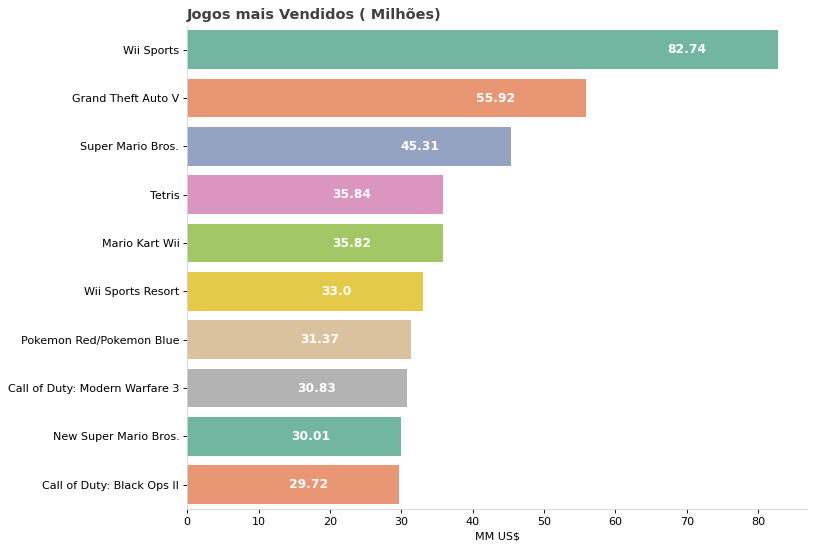

In [ ]:
#Criação da Aréa dos Gráficos
fig01, ax01 = plt.subplots(nrows = 1, ncols = 1, figsize=(10,8), dpi=80)
             
# G1 - Lançamentos por Categoria
sns.barplot(x = df_games_vendas_mundo["Vendas_Total"], y = df_games_vendas_mundo.index, 
            ax= ax01 ,
            data = df_games_vendas_mundo, 
            palette= "Set2"
            )

ax01.set_title("Jogos mais Vendidos ( Milhões)",
               color = "#414040",
               fontsize= 13, 
               weight="bold", 
               loc='left'
               )

# Definição dos rótulos dos eixos
ax01.set_ylabel("")
ax01.set_xlabel("")
ax01.grid(False)

plt.xlabel('MM US$')

# Formatando as espinhas do gráfico
ax01.spines["right"].set_visible(False)
ax01.spines["top"].set_visible(False)
ax01.spines["bottom"].set_color("#cfd8dc")
ax01.spines["left"].set_color("#cfd8dc")

# Colocando os rótulos de dados no gráfico 
for i in range(len(df_games_vendas_mundo)): # Varre-se todo o intervalo de jogos vendidos no mundo
  ax01.text(df_games_vendas_mundo["Vendas_Total"][i] - 10, i, df_games_vendas_mundo["Vendas_Total"][i], fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')

In [ ]:
# Acessando cada um dos valores das barras horizontais
df_games_vendas_mundo["Vendas_Total"][0]

82.74


# 02. Quais os jogos mais vendidos em cada Mercado Abaixo ?


- América do Norte
- Europa 
- Japão 
- Outros 
---

- Utiliza-se do método NLARGEST, semelhante ao SORT_VALUES, definindo o número de linhas e a coluna, respectivamente;

- Utiiza-se do método ILOC, o qual realiza um SLICE invertendo a ordem dos valores para ser coerente com o gráfico anterior.

## AMÉRICA DO NORTE - MANIPULAÇÃO DE DADOS

## OUTRAS REGIÕES - MANIPULAÇÃO DE DADOS

In [ ]:
## AMÉRICA DO NORTE
df_games_vendas_NA = df_games.groupby(["Jogo"]).agg({"Vendas_NA": "sum"})

df_games_vendas_NA = df_games_vendas_NA.sort_values("Vendas_NA",
                                                    ascending= False)

df_games_vendas_NA["Vendas_NA"] = df_games_vendas_NA["Vendas_NA"].round(2)

df_games_vendas_NA = df_games_vendas_NA.nlargest(5, "Vendas_NA") # Usa-se esse parâmetro para fixar e imprimir a quantidade de dados pré-determinada.

df_games_vendas_NA

,Vendas_NA
Jogo,
Wii Sports,41.49
Super Mario Bros.,32.48
Duck Hunt,26.93
Tetris,26.17
Grand Theft Auto V,23.46


## AMÉRICA DO NORTE - ESTRUTURAÇÃO GRÁFICA

## EUROPA - MANIPULAÇÃO DE DADOS

In [ ]:
## EUROPA
#Agrupando as Vendas por jogo
df_games_vendas_EU = df_games.groupby(["Jogo"]).agg({"Vendas_EU": "sum"})

df_games_vendas_EU = df_games_vendas_EU.sort_values("Vendas_EU",
                                                    ascending= False)

df_games_vendas_EU["Vendas_EU"] = df_games_vendas_EU["Vendas_EU"].round(2)

df_games_vendas_EU = df_games_vendas_EU.nlargest(5, "Vendas_EU")

df_games_vendas_EU

,Vendas_EU
Jogo,
Wii Sports,29.02
Grand Theft Auto V,23.04
Mario Kart Wii,12.88
FIFA 15,12.40
Call of Duty: Modern Warfare 3,11.29


### EUROPA - ESTRUTURAÇÃO GRÁFICA

## JAPÃO - MANIPULAÇÃO DE DADOS

In [ ]:
## JAPÃO
df_games_vendas_JP = df_games.groupby(["Jogo"]).agg({"Vendas_JP": "sum"})

df_games_vendas_JP = df_games_vendas_JP.sort_values("Vendas_JP", 
                                                    ascending= False)

df_games_vendas_JP["Vendas_JP"] = df_games_vendas_JP["Vendas_JP"].round(2)

df_games_vendas_JP = df_games_vendas_JP.nlargest(5, "Vendas_JP")

df_games_vendas_JP

,Vendas_JP
Jogo,
Pokemon Red/Pokemon Blue,10.22
Pokemon Gold/Pokemon Silver,7.20
Super Mario Bros.,6.96
New Super Mario Bros.,6.50
Pokemon Diamond/Pokemon Pearl,6.04


## JAPÃO - ESTRUTURAÇÃO GRÁFICA

In [ ]:
## RESTANTE DO MUNDO
df_games_vendas_Outros = df_games.groupby(["Jogo"]).agg({"Vendas_Outros": "sum"})

df_games_vendas_Outros = df_games_vendas_Outros.sort_values("Vendas_Outros", 
                                                            ascending= False)

df_games_vendas_Outros["Vendas_Outros"] = df_games_vendas_Outros["Vendas_Outros"].round(2)

df_games_vendas_Outros = df_games_vendas_Outros.nlargest(5, "Vendas_Outros")

df_games_vendas_Outros

,Vendas_Outros
Jogo,
Grand Theft Auto: San Andreas,10.72
Wii Sports,8.46
Grand Theft Auto V,8.03
Gran Turismo 4,7.53
Call of Duty: Black Ops II,3.88


### OUTRAS REGIÕES - ESTRUTURAÇÃO GRÁFICA

## IMPRESSÃO DOS DADOS/ GRÁFICOS ACIMA EM UMA ÚNICA ÁREA GRÁFICA PARA ANÁLISE GLOBAL

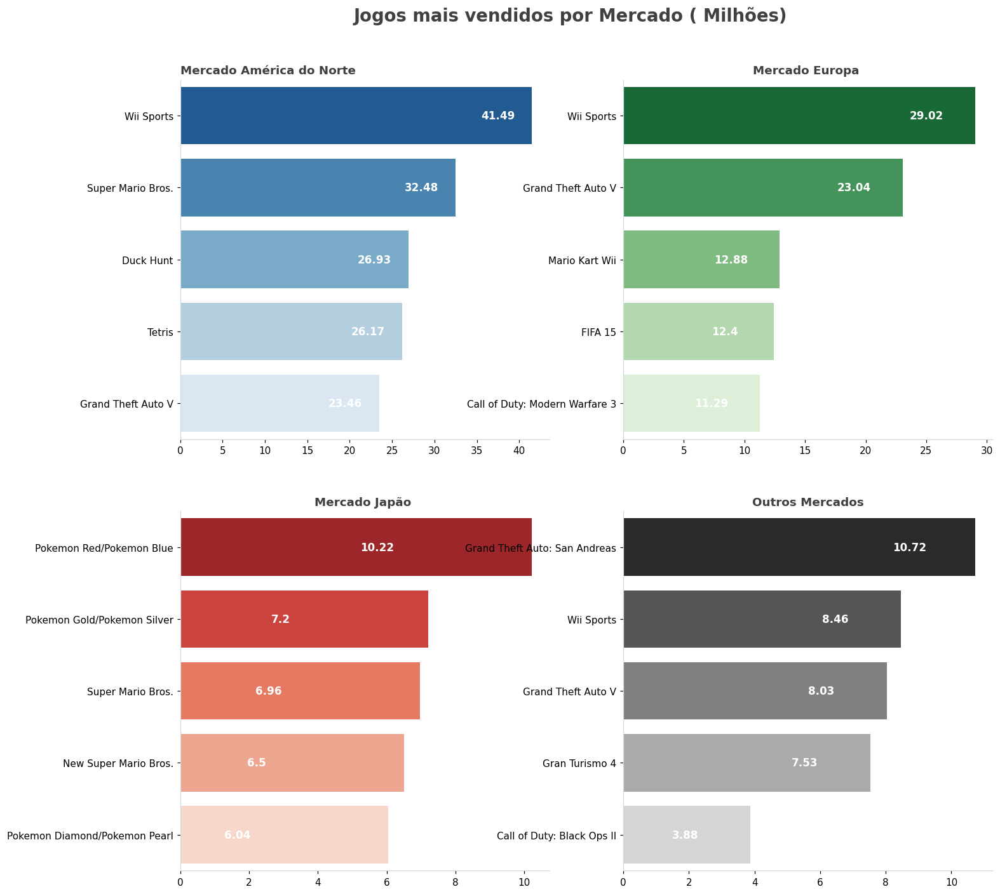

In [ ]:
# TESTE

#Criação da Aréa dos Gráficos
fig02, ax02 = plt.subplots(nrows = 2, ncols = 2, figsize=(15,15), dpi=110)
ax02 = ax02.flatten()
fig02.suptitle("Jogos mais vendidos por Mercado ( Milhões) ", fontsize= 18, y= 0.95, weight = "bold", color = "#414040");

## Grafico 1 - AMÉRICA DO NORTE 
sns.barplot(x = df_games_vendas_NA["Vendas_NA"], y = df_games_vendas_NA.index, ax= ax02[0] ,data = df_games_vendas_NA, palette= "Blues_r")

ax02[0].set_title("Mercado América do Norte ",color = "#414040",fontsize=12,weight="bold", loc='left')

ax02[0].set_ylabel("")
ax02[0].set_xlabel("")
ax02[0].grid(False)

ax02[0].spines["right"].set_visible(False)
ax02[0].spines["top"].set_visible(False)
ax02[0].spines["bottom"].set_color("#cfd8dc")
ax02[0].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_games_vendas_NA)):
  ax02[0].text(df_games_vendas_NA["Vendas_NA"][i] - 4, i, df_games_vendas_NA["Vendas_NA"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='center',weight='bold')

  
## Grafico 2 - EUROPA
sns.barplot(x = df_games_vendas_EU["Vendas_EU"], y = df_games_vendas_EU.index, ax= ax02[1] ,data = df_games_vendas_EU, palette= "Greens_r")

ax02[1].set_title("Mercado Europa ",color = "#414040",fontsize=12,weight="bold")

ax02[1].set_ylabel("")
ax02[1].set_xlabel("")
ax02[1].grid(False)

ax02[1].spines["right"].set_visible(False)
ax02[1].spines["top"].set_visible(False)
ax02[1].spines["bottom"].set_color("#cfd8dc")
ax02[1].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_games_vendas_EU)):
  ax02[1].text(df_games_vendas_EU["Vendas_EU"][i] - 4,i, df_games_vendas_EU["Vendas_EU"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='center',weight='bold')


## Grafico 3 - JAPÃO
sns.barplot(x = df_games_vendas_JP["Vendas_JP"], y = df_games_vendas_JP.index, ax= ax02[2] ,data = df_games_vendas_JP, palette= "Reds_r")

ax02[2].set_title("Mercado Japão ",color = "#414040",fontsize=12,weight="bold")

ax02[2].set_ylabel("")
ax02[2].set_xlabel("")
ax02[2].grid(False)

ax02[2].spines["right"].set_visible(False)
ax02[2].spines["top"].set_visible(False)
ax02[2].spines["bottom"].set_color("#cfd8dc")
ax02[2].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_games_vendas_JP)):
  ax02[2].text(df_games_vendas_JP["Vendas_JP"][i] - 4,i, df_games_vendas_JP["Vendas_JP"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')

## Grafico 4 - OUTRAS REGIÕES
sns.barplot(x = df_games_vendas_Outros["Vendas_Outros"], y = df_games_vendas_Outros.index, ax= ax02[3] ,data = df_games_vendas_Outros, palette= "binary_r")

ax02[3].set_title("Outros Mercados",color = "#414040",fontsize=12,weight="bold")

ax02[3].set_ylabel("")
ax02[3].set_xlabel("")
ax02[3].grid(False)

ax02[3].spines["right"].set_visible(False)
ax02[3].spines["top"].set_visible(False)
ax02[3].spines["bottom"].set_color("#cfd8dc")
ax02[3].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_games_vendas_Outros)):
  ax02[3].text(df_games_vendas_Outros["Vendas_Outros"][i] - 2,i, df_games_vendas_Outros["Vendas_Outros"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='center',weight='bold')

# 03. Qual o faturamento ao longo dos anos ?



---

- Utilização do método QUERY ( ), o qual,  filtra as filas do DataFrame do chamador utilizando a expressão de consulta dada, neste caso Ano < 2016

In [ ]:
#Agrupando as Vendas por Console
df_games_ano_faturamento = df_games.groupby("Ano").agg({"Vendas_Total": "sum"})
df_games_ano_faturamento = df_games_ano_faturamento.sort_values("Ano", 
                                                                ascending= True)

df_games_ano_faturamento["Vendas_Total"] = df_games_ano_faturamento["Vendas_Total"].round(2)

df_games_ano_faturamento = df_games_ano_faturamento.query("Ano < 2016")

df_games_ano_faturamento.tail(10)

,Vendas_Total
Ano,
2006.0,521.04
2007.0,609.92
2008.0,678.90
2009.0,667.30
2010.0,600.29
2011.0,515.80
2012.0,363.49
2013.0,368.11
2014.0,337.03


In [ ]:
# Confirmando que o ano é menor que 2016 com a função TAIL()
df_games_ano_faturamento.tail(10)

,Vendas_Total
Ano,
2006.0,521.04
2007.0,609.92
2008.0,678.90
2009.0,667.30
2010.0,600.29
2011.0,515.80
2012.0,363.49
2013.0,368.11
2014.0,337.03


## GRÁFICO ->  VOLUME DE VENDAS X ANOS
[ RODRIGO ]

---

Utilização da biblioteca PLOTLY . EXPRESS para plotar gráfico interativo, sendo um histograma concatenado com box.

In [ ]:
pio.templates.default = 'plotly'

fig_px = px.histogram(data_frame=df_games, 
                      x='Ano',
                      y='Vendas_Total', 
                      marginal='box', 
                      width=1300, 
                      height=800, 
                      title='Volume de Vendas X Anos')
fig_px.show()

In [ ]:
df_games.head(2)

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24


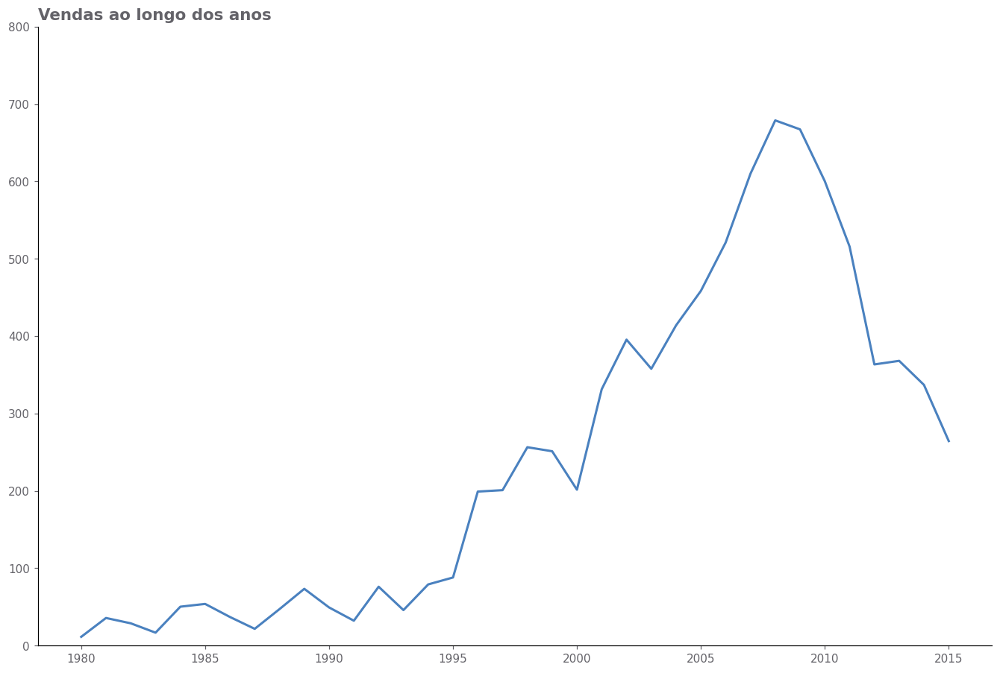

In [ ]:
#Criação da Aréa dos Gráficos
fig03, ax03 = plt.subplots(nrows = 1, ncols = 1, figsize=(15,10), dpi=110)
             
#Vendas ao longo dos anos 
ax03.plot('Vendas_Total', data = df_games_ano_faturamento, color= '#4A81BF', lw = 2,label = 'Vendas em Milhões')
ax03.set_title('Vendas ao longo dos anos', color = '#646369',loc='left', fontsize=14, weight='bold')

ax03.tick_params(axis='both', colors ='#646369',labelsize=10)   

ax03.spines['right'].set_visible(False)
ax03.spines['top'].set_visible(False)

ax03.axis(ymin=0,ymax=800);

## CONCLUSÃO

[ RODRIGO ]

---

- Estatísticamente falando é percebido a presença de OUTLIERS tanto no HISTOGRAMA quanto no BOX;

- Apresenta uma curva Gaussiana ( Normal ) com assimetria à esquerda, ou seja:

    [ Assimetria à esquerda:  moda > mediana > média ]

- Esses dados demonstram o crescimento de jogos ao longo do anos tendo como pico a região onde se encontra a Medianano ano de 2009 ( q3 ), alcançando 1431 unidades vendidas;

- O maior volume de vendas é visto no período entre 2003 à 2007 ( q2 ), porém, alcançado com a presenção de crescimento exponencial;

- O período entre 1993 a 2003 ( q1 ), inicia-se a consolidação dos games como forma de entretenimento jovem, o que era raro nos anos anteriores como visto pea presença de OUTLIERS;

- Por fim, no período de 2010 à 2016, há um decrécimo abrupto das vendas, podendo ser atribuido esse efeito a maior utilização de smartphones e computadores para os mesmos fins.

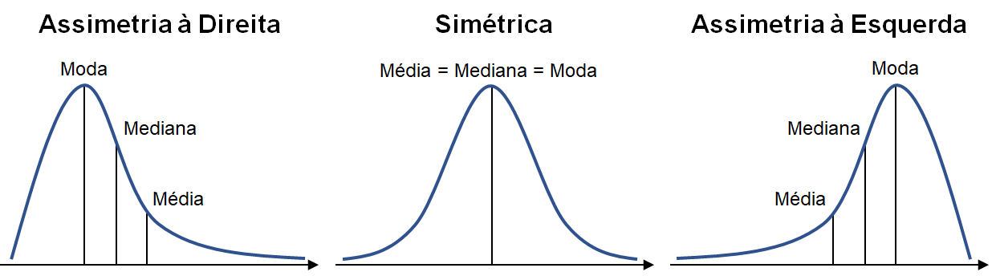

# 04. Quais consoles tiveram mais lançamentos e mais vendas ?



In [ ]:
# QTDE DE CONSOLES NO MERCADO
df_lancamentos_por_consoles = df_games.groupby("Plataforma").agg(QT_lançamento = pd.NamedAgg(column='Vendas_Total', 
                                                                                             aggfunc= "count"),
                                                                   QT_venda = pd.NamedAgg(column='Vendas_Total', 
                                                                                          aggfunc= sum)
                                                                   )

df_lancamentos_por_consoles = df_lancamentos_por_consoles.sort_values("QT_venda", 
                                                                      ascending= False)

df_lancamentos_por_consoles = df_lancamentos_por_consoles.nlargest(10, 'QT_venda')

df_lancamentos_por_consoles["QT_venda"] = df_lancamentos_por_consoles["QT_venda"].round(2)

df_lancamentos_por_consoles

,QT_lançamento,QT_venda
Plataforma,,
PS2,2127,1233.46
X360,1234,969.60
PS3,1304,949.35
Wii,1290,909.81
DS,2131,818.91
PS,1189,727.39
GBA,786,305.62
PSP,1197,291.71
PS4,336,278.10


## GRÁFICO -> PLATAFORMAS MAIS VENDIDOS | PUBLISHERS QUE MAIS LANÇARAM GAMES


In [ ]:
df_games.head(1)

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74


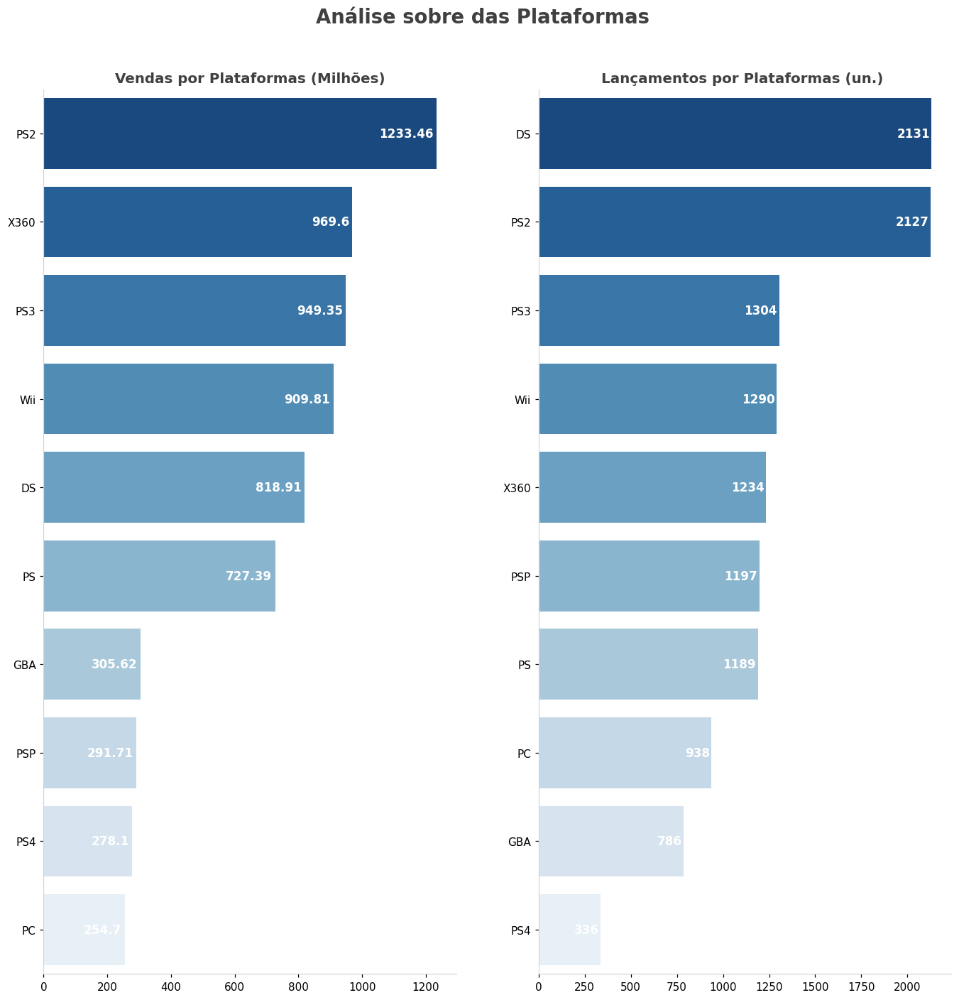

In [ ]:

#Criação da Aréa dos Gráficos
fig04, ax04 = plt.subplots(nrows = 1, ncols = 2, figsize=(15,15), dpi=110)
fig04.suptitle("Análise sobre das Plataformas", fontsize= 18, y= 0.95, weight = "bold", color = "#414040")
             
# G1 - Lançamentos por Console
sns.barplot(x = df_lancamentos_por_consoles["QT_venda"], y = df_lancamentos_por_consoles.index, ax= ax04[0] ,data = df_lancamentos_por_consoles, palette= "Blues_r")
ax04[0].set_title("Vendas por Plataformas (Milhões)",color = "#414040",fontsize= 13,weight="bold")

ax04[0].set_ylabel("")
ax04[0].set_xlabel("")
ax04[0].grid(False)

ax04[0].spines["right"].set_visible(False)
ax04[0].spines["top"].set_visible(False)
ax04[0].spines["bottom"].set_color("#cfd8dc")
ax04[0].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_lancamentos_por_consoles)):
  ax04[0].text(df_lancamentos_por_consoles["QT_venda"][i] - 10,i, df_lancamentos_por_consoles["QT_venda"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')

#Atualizando a Ordem do DataFrame
df_lancamentos_por_consoles =  df_lancamentos_por_consoles.sort_values("QT_lançamento", ascending= False)

#G2 - Vendas por Console
sns.barplot(x = df_lancamentos_por_consoles["QT_lançamento"], y = df_lancamentos_por_consoles.index, ax= ax04[1] ,data = df_lancamentos_por_consoles, palette= "Blues_r")
ax04[1].set_title("Lançamentos por Plataformas (un.) ",color = "#414040",fontsize=13,weight="bold")

ax04[1].set_ylabel("")
ax04[1].set_xlabel("")
ax04[1].grid(False)

ax04[1].spines["right"].set_visible(False)
ax04[1].spines["top"].set_visible(False)
ax04[1].spines["bottom"].set_color("#cfd8dc")
ax04[1].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_lancamentos_por_consoles)):
  ax04[1].text(df_lancamentos_por_consoles["QT_lançamento"][i] - 10,i, df_lancamentos_por_consoles["QT_lançamento"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')

## CONCLUSÃO 

[ LUISA ]



# 05. QUAIS OS MAIORES PUBLISHERS ?



In [ ]:
## Tipos de Jogos
generos = df_games['Publisher'].unique()
generos


array(['Nintendo', 'Microsoft Game Studios', 'Take-Two Interactive',
       'Sony Computer Entertainment', 'Activision', 'Ubisoft',
       'Bethesda Softworks', 'Electronic Arts', 'Sega', 'SquareSoft',
       'Atari', '505 Games', 'Capcom', 'GT Interactive',
       'Konami Digital Entertainment',
       'Sony Computer Entertainment Europe', 'Square Enix', 'LucasArts',
       'Virgin Interactive', 'Warner Bros. Interactive Entertainment',
       'Universal Interactive', 'Eidos Interactive', 'RedOctane',
       'Vivendi Games', 'Enix Corporation', 'Namco Bandai Games',
       'Palcom', 'Hasbro Interactive', 'THQ', 'Fox Interactive',
       'Acclaim Entertainment', 'MTV Games', 'Disney Interactive Studios',
       'Majesco Entertainment', 'Codemasters', 'Red Orb', 'Level 5',
       'Arena Entertainment', 'Midway Games', 'JVC', 'Deep Silver',
       '989 Studios', 'NCSoft', 'UEP Systems', 'Parker Bros.', 'Maxis',
       'Imagic', 'Tecmo Koei', 'Valve Software', 'ASCII Entertainment',
     

### MANIPULAÇÃO DOS DADOS DE PUBLISHERS

--- 

- PUBLISHER_01 -> 
DataFrame com a quantidade de lançamentos e vendas por Publisher;

- PUBLISHER_02 -> #Separação dos 15 publishers que possuem maior índice de vendas. Esses 15 publishers representam 80 % das vendas dos jogos nesse período. ( Pareto 80/20 )



In [ ]:
## PUBLISHER_01
df_vendas_por_publisher = df_games.groupby("Publisher").agg(QT_lançamento = pd.NamedAgg(column='Vendas_Total', 
                                                                                        aggfunc= "count"),
                                                            QT_venda = pd.NamedAgg(column='Vendas_Total',
                                                                                   aggfunc= sum)
                                                            )

df_vendas_por_publisher =  df_vendas_por_publisher.sort_values("QT_lançamento", 
                                                               ascending= False)

df_vendas_por_publisher["QT_venda"] = df_vendas_por_publisher["QT_venda"].round(2)

df_vendas_por_publisher["PERC_lançamento"] = (df_vendas_por_publisher["QT_lançamento"] / df_vendas_por_publisher["QT_lançamento"].sum()* 100).round(2)

df_vendas_por_publisher["PERC_venda"] = (df_vendas_por_publisher["QT_venda"] / df_vendas_por_publisher["QT_venda"].sum()* 100).round(2)

df_vendas_por_publisher




,QT_lançamento,QT_venda,PERC_lançamento,PERC_venda
Publisher,,,,
Electronic Arts,1339,1093.39,8.22,12.41
Activision,966,721.41,5.93,8.19
Namco Bandai Games,928,253.65,5.70,2.88
Ubisoft,918,473.54,5.64,5.37
Konami Digital Entertainment,823,278.56,5.05,3.16
...,...,...,...,...
Ertain,1,0.05,0.01,0.00
Epic Games,1,0.01,0.01,0.00
Seventh Chord,1,0.08,0.01,0.00


In [ ]:
## PUBLISHER_02
df_vendas_por_publisher =  df_vendas_por_publisher.sort_values("QT_venda", 
                                                               ascending= False)

df_vendas_por_publisher = df_vendas_por_publisher.nlargest(15, 'QT_venda')

df_vendas_por_publisher

,QT_lançamento,QT_venda,PERC_lançamento,PERC_venda
Publisher,,,,
Nintendo,696,1784.43,4.27,20.25
Electronic Arts,1339,1093.39,8.22,12.41
Activision,966,721.41,5.93,8.19
Sony Computer Entertainment,682,607.28,4.19,6.89
Ubisoft,918,473.54,5.64,5.37
Take-Two Interactive,412,399.30,2.53,4.53
THQ,712,340.44,4.37,3.86
Konami Digital Entertainment,823,278.56,5.05,3.16
Sega,632,270.70,3.88,3.07


In [ ]:
#Representação das 15 Publishers selecionadas na quantidade de vendas do Dataset 
df_vendas_por_publisher["PERC_venda"].sum()



80.6

## GRÁFICO -> PUBLISHERS MAIS VENDEM | PUBLISHERS QUE MAIS LANÇARAM GAMES

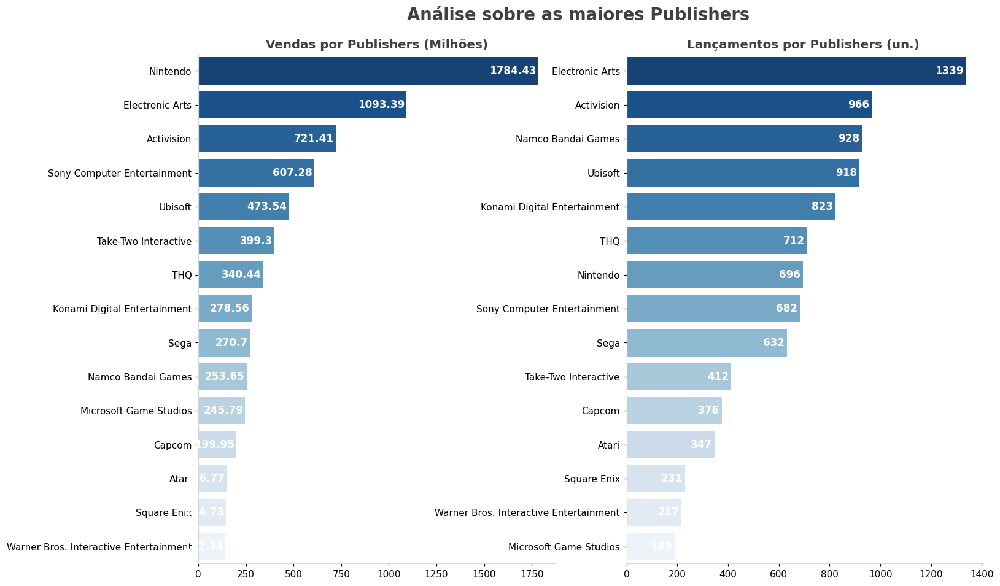

In [ ]:
#Criação da Aréa dos Gráficos
fig05, ax05 = plt.subplots(nrows = 1, ncols = 2, figsize=(15,10), dpi=110)
fig05.suptitle("Análise sobre as maiores Publishers", 
               fontsize= 18, y= 0.95, 
               weight = "bold", 
               color = "#414040")
             
# G1 - Lançamentos por Categoria
sns.barplot(x = df_vendas_por_publisher["QT_venda"], 
            y = df_vendas_por_publisher.index,
            ax= ax05[0],
            data = df_vendas_por_publisher, 
            palette= "Blues_r")

ax05[0].set_title("Vendas por Publishers (Milhões)",
                  color = "#414040",
                  fontsize= 13,
                  weight="bold")

ax05[0].set_ylabel("")
ax05[0].set_xlabel("")
ax05[0].grid(False)

ax05[0].spines["right"].set_visible(False)
ax05[0].spines["top"].set_visible(False)
ax05[0].spines["bottom"].set_color("#cfd8dc")
ax05[0].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_vendas_por_publisher)):
  ax05[0].text(df_vendas_por_publisher["QT_venda"][i] - 10, 
               i, 
               df_vendas_por_publisher["QT_venda"][i] ,
               fontsize=11, color='white',
               verticalalignment='center',
               horizontalalignment='right',
               weight='bold')

#Atualizando a Ordem do DataFrame
df_vendas_por_publisher =  df_vendas_por_publisher.sort_values("QT_lançamento", ascending= False)

#G2 - Vendas por Categoria
sns.barplot(x = df_vendas_por_publisher["QT_lançamento"], y = df_vendas_por_publisher.index, ax= ax05[1] ,data = df_vendas_por_publisher, palette= "Blues_r")
ax05[1].set_title("Lançamentos por Publishers (un.) ",color = "#414040",fontsize=13,weight="bold")

ax05[1].set_ylabel("")
ax05[1].set_xlabel("")
ax05[1].grid(False)

ax05[1].spines["right"].set_visible(False)
ax05[1].spines["top"].set_visible(False)
ax05[1].spines["bottom"].set_color("#cfd8dc")
ax05[1].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_vendas_por_publisher)):
  ax05[1].text(df_vendas_por_publisher["QT_lançamento"][i] - 10,i, df_vendas_por_publisher["QT_lançamento"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')


In [ ]:
df_games.head(2)

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24


## CONCLUSÃO

[ DANIEL ]

---

- Esse gráfico trouxe pra gente uma visão, de como o número de jogos lançados não reflete na quantidade de vendas de uma Publisher, como exemplo citado a bandai namco, que teve um número expressivo de títulos lançados, porém a venda não atendeu a esse valor. 

- O fator mais relevante nesse caso é o sucesso e popularidade desses jogos lançados ao olhar de quem consome.

# 06. QUAIS CATEGORIAS MAIS RENTÁVEIS?



### .UNIQUE( )

- Este método utiliza o filtro para mostrar valores únicos.

In [ ]:
## Tipos de Jogos
generos = df_games['Categoria'].unique()
generos


array(['Sports', 'Platform', 'Racing', 'Role-Playing', 'Puzzle', 'Misc',
       'Shooter', 'Simulation', 'Action', 'Fighting', 'Adventure',
       'Strategy'], dtype=object)

In [ ]:
df_games.head()

,Rank,Jogo,Plataforma,Ano,Categoria,Publisher,Vendas_NA,Vendas_EU,Vendas_JP,Vendas_Outros,Vendas_Total
idx,,,,,,,,,,,
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


### MANIPULAÇÃO DOS DADOS DE CATEGORIAS

In [ ]:
# Criando o DataFrame para os gráficos 

# DataFrame quantidade de lançamentos e vendas por Categoria 

df_vendas_por_categoria = df_games.groupby("Categoria").agg(QT_lançamento = pd.NamedAgg(column='Vendas_Total', 
                                                                                        aggfunc= "count"),
                                                            QT_venda = pd.NamedAgg(column='Vendas_Total', 
                                                                                   aggfunc= sum)
                                                            )


df_vendas_por_categoria =    df_vendas_por_categoria.sort_values("QT_lançamento", 
                                                                 ascending= False)

df_vendas_por_categoria["QT_venda"] = df_vendas_por_categoria["QT_venda"].round(2)

#Criando colunas de Percentual 
df_vendas_por_categoria["PERC_lançamento"] = (df_vendas_por_categoria["QT_lançamento"] / df_vendas_por_categoria["QT_lançamento"].sum()* 100).round(2)
df_vendas_por_categoria["PERC_venda"] = (df_vendas_por_categoria["QT_venda"] / df_vendas_por_categoria["QT_venda"].sum()* 100).round(2)

df_vendas_por_categoria




,QT_lançamento,QT_venda,PERC_lançamento,PERC_venda
Categoria,,,,
Action,3251,1722.84,19.96,19.55
Sports,2304,1309.24,14.14,14.86
Misc,1686,789.87,10.35,8.96
Role-Playing,1470,923.83,9.02,10.48
Shooter,1282,1026.20,7.87,11.65
Adventure,1274,234.59,7.82,2.66
Racing,1225,726.76,7.52,8.25
Platform,875,829.13,5.37,9.41
Simulation,848,389.98,5.21,4.43


## GRÁFICO -> CATEGORIAS MAIS VENDEM | CATEGORIAS QUE MAIS LANÇARAM GAMES

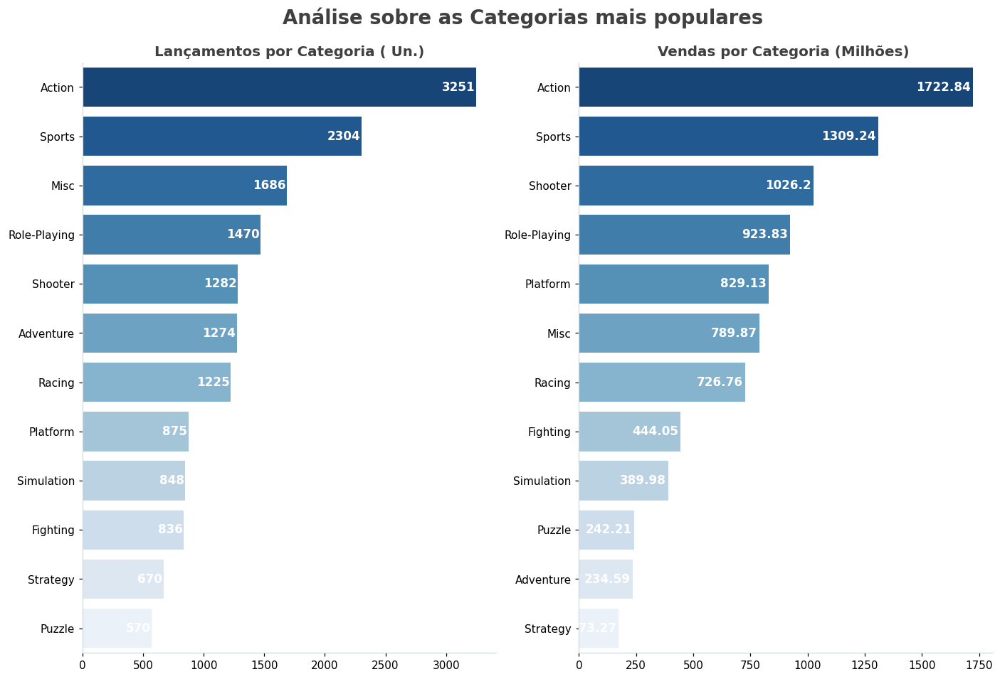

In [ ]:
#Criação da Aréa dos Gráficos
fig06, ax06 = plt.subplots(nrows = 1, ncols = 2, figsize=(15,10), dpi=110)
fig06.suptitle("Análise sobre as Categorias mais populares", fontsize= 18, y= 0.95, weight = "bold", color = "#414040")
             
# G1 - Lançamentos por Categoria
sns.barplot(x = df_vendas_por_categoria["QT_lançamento"], y = df_vendas_por_categoria.index, ax= ax06[0] ,data = df_vendas_por_categoria, palette= "Blues_r")
ax06[0].set_title("Lançamentos por Categoria ( Un.)",color = "#414040",fontsize= 13,weight="bold")

ax06[0].set_ylabel("")
ax06[0].set_xlabel("")
ax06[0].grid(False)

ax06[0].spines["right"].set_visible(False)
ax06[0].spines["top"].set_visible(False)
ax06[0].spines["bottom"].set_color("#cfd8dc")
ax06[0].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_vendas_por_categoria)):
  ax06[0].text(df_vendas_por_categoria["QT_lançamento"][i] - 10,i, df_vendas_por_categoria["QT_lançamento"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')

#Atualizando a Ordem do DataFrame
df_vendas_por_categoria =  df_vendas_por_categoria.sort_values("QT_venda", ascending= False)

#G2 - Vendas por Categoria
sns.barplot(x = df_vendas_por_categoria["QT_venda"], y = df_vendas_por_categoria.index, ax= ax06[1] ,data = df_vendas_por_categoria, palette= "Blues_r")
ax06[1].set_title("Vendas por Categoria (Milhões) ",color = "#414040",fontsize=13,weight="bold")

ax06[1].set_ylabel("")
ax06[1].set_xlabel("")
ax06[1].grid(False)

ax06[1].spines["right"].set_visible(False)
ax06[1].spines["top"].set_visible(False)
ax06[1].spines["bottom"].set_color("#cfd8dc")
ax06[1].spines["left"].set_color("#cfd8dc")

#Colocando os rótulos de dados no gráfico 
for i in range(len(df_vendas_por_categoria)):

  ax06[1].text(df_vendas_por_categoria["QT_venda"][i] - 10,i, df_vendas_por_categoria["QT_venda"][i] , fontsize=11, color='white',verticalalignment='center',horizontalalignment='right',weight='bold')


##  ANÁLISE DE RESULTADOS


---

- Podemos dizer que os jogos mais populares são os jogos de AÇÃO, seguidos dos jogos de ESPORTES. Estes são os jogos com mais vendas e mais títulos lançados nos ultimos anos. 

- Os jogos de MÚSICA e os jogos de TIRO chamaram nossa atenção nessa analise, eles possuem comportamentos inversos. 
  
- Os jogos de MÚSICA possuem muito lançamento no mercado, entretando não alcançaram um número alto de vendas ao comparado com as demais categorias. 
  
- Em contrapartida, possuem um número menor de lançamentos no mercado, mas mesmo assim apresent valores de vendas superiores. 
- Jogos de Aventura e Jogos de Música 